# Overview

New things:

1. Smoothing functions
2. New aggregation functions 

Open problems: 

1. Smart graph pruning. 
2. Good aggregation. 


# Source

In [26]:
source('../R/libs.R')
source('../R/utils_ui.R')
source('../R/utils_multi.R')

## Functions, in the order in which they are used: 
source('../R/utils_initdata.R')
sourceCpp('../src/utils_initdata.cpp')

source('../R/utils_gradients.R')
sourceCpp('../src/utils_gradients.cpp')

source('../R/utils_dmt.R')
sourceCpp('../src/utils_dmt.cpp')

source('../R/utils_shapes.R')
sourceCpp('../src/utils_shapes.cpp')

source('../R/utils_aggregation.R')
sourceCpp('../src/utils_aggregation.cpp')


# Parameters

In [27]:
verbose = TRUE
show_plots = TRUE

###### STEP 0 ######
npcs = 10
pca_weight_by = 'type_lvl1' ## (OPTIONAL, HAS LITTLE EFFECT). If none, set to NULL
## Graph pruning
prune_thresh_quantile = 0.95
prune_min_cells = 10


###### STEP 1: GRADIENTS ######
smooth_distance = c('none', 'euclidean', 'projected', 'constant')[3] 
smooth_similarity = c('none', 'euclidean', 'projected', 'constant')[3] 


###### STEP 2: DMT ######
## ... no options


###### STEP 3: AGGREGATION ######
max_npts = 50
min_npts = 5
alpha = 1 ## 0.2 = conservative merging, 2 = liberal merging 



# Step 0: prepare data structures

## load

### small - dense

In [28]:
counts = readRDS('../data/counts1.rds')
meta_data = readRDS('../data/meta1.rds')


meta_vars_include = c('type_lvl1', 'type_lvl2', 'hubID')

### small - sparse

In [29]:
# counts = readRDS('../data/counts4.rds')
# meta_data = fread('../data/meta4.csv')


### medium

In [30]:
# counts = spatula::readMM('../data/counts2.mtx')
# meta_data = fread('../data/meta2.csv')
# meta_data$cell = as.character(meta_data$cell)
# colnames(counts) = meta_data$cell
# rownames(counts) = readLines('../data/genes2.txt')


### big

In [31]:
# counts = spatula::readMM('../data/counts3.mtx')
# meta_data = fread('../data/meta3.csv')
# meta_data$cell = as.character(meta_data$cell)
# colnames(counts) = meta_data$cell
# rownames(counts) = readLines('../data/genes3.txt')


## prepare

In [32]:
dmt = init_data(meta_data$X, meta_data$Y, counts, meta_data, meta_vars_include)
dmt = prune_graph(dmt, thresh_quantile = prune_thresh_quantile, mincells = prune_min_cells) 
dmt = add_exterior_triangles(dmt)



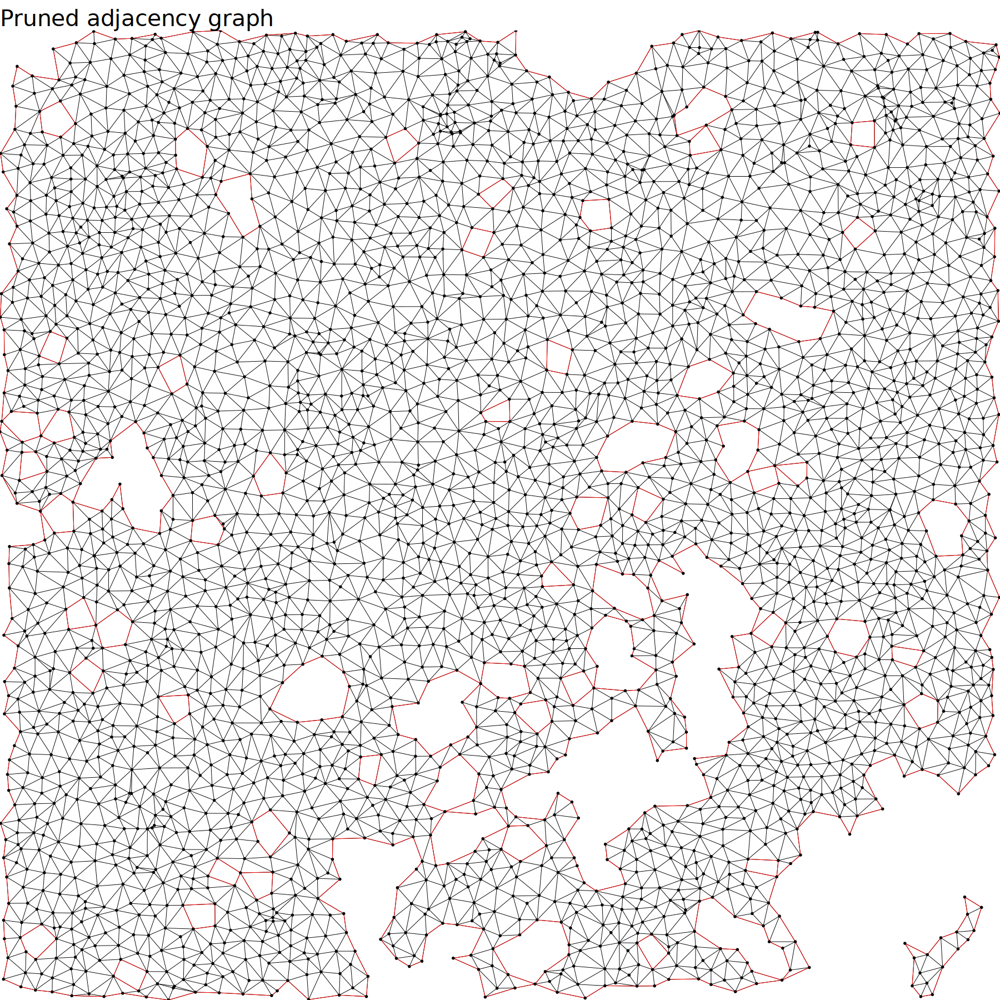

In [33]:
fig.size(15, 15)
# fig.size(20, 20)

if (show_plots) {    
    ggplot() + 
    
        # ## big data 
        # geom_point(data = dmt$pts, aes(X, Y), shape = '.', alpha = .1) + 
        # geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
    
        ## small data 
        geom_segment(data = dmt$edges, aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'black', lwd = .2) + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red', lwd = .2) + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
    
        theme_void(base_size = 20) + 
        coord_cartesian(expand = FALSE) + 
        labs(title = 'Pruned adjacency graph') + 
        NULL
}


## pca

In [34]:
if (is.null(pca_weight_by)) {
    dmt$udv_cells = dmt$counts %>% 
        normalizeData(median(colSums(dmt$counts)), 'log') %>% 
        weighted_pca(rep(1, ncol(dmt$counts)), npc = npcs, do_corr = FALSE)
} else {
    stopifnot(pca_weight_by %in% colnames(dmt$pts))
    y = dmt$pts[[pca_weight_by]]
    w = as.numeric(1 / table(y)[y])
    w = w * (length(y) / sum(w))

    dmt$udv_cells = dmt$counts %>% 
        normalizeData(median(colSums(dmt$counts)), 'log') %>% 
        weighted_pca(w, npc = npcs, do_corr = FALSE)
}



# Step 1: compute gradients on all data structures

In [35]:
field = compute_gradients(dmt, smooth_distance, smooth_similarity)
field = compress_gradients_svd(field)


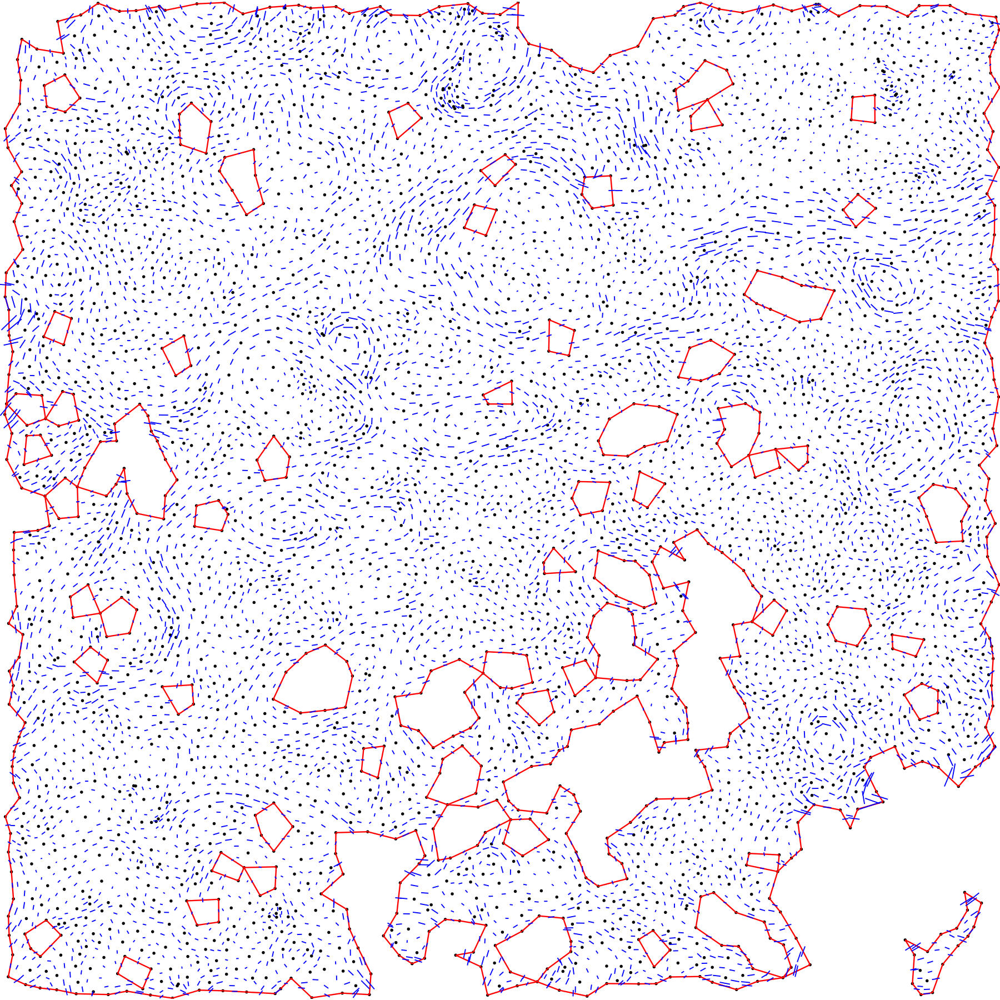

In [36]:
if (show_plots) {    

    len_plot_constant = .8
    fig.size(15, 15)
    # fig.size(20, 20)
    ggplot() + 
        geom_point(data = dmt$pts, aes(X, Y), size = .5) + 
        geom_segment(data = dmt$edges[boundary == TRUE, ], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'red') + 
    
        ## Triangle Gradients
        geom_segment(
            data = data.table(dmt$tris, field$tris_svd), 
            aes(
                x=X-len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                y=Y-len_plot_constant*(len_grad+len_ortho)*dy_ortho, 
                xend=X+len_plot_constant*(len_grad+len_ortho)*dx_ortho, 
                yend=Y+len_plot_constant*(len_grad+len_ortho)*dy_ortho
            ), 
            linewidth = .4, alpha = 1, 
            color = 'blue'
        ) + 
    
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        NULL
}


# Step 2: DMT


## compute f

In [37]:
dmt = dmt_set_f(dmt, field)

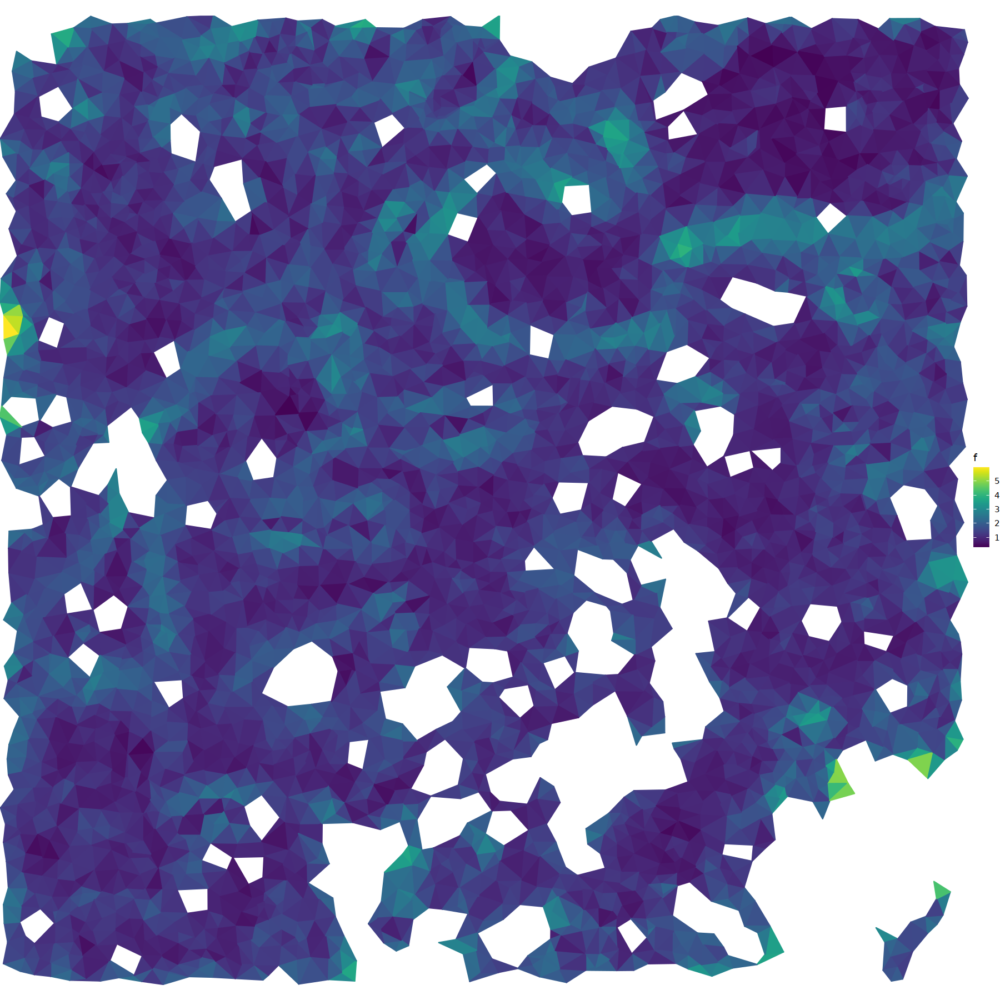

In [38]:
if (show_plots) {    
    ntri = max(which(dmt$tris$external == FALSE))
    i = t(dmt$tri_to_pt[1:ntri, ])@i+1
    plt_df = data.table(
        X = dmt$pts$X[i],
        Y = dmt$pts$Y[i],
        f = rep(dmt$tris$f[1:ntri], each = 3)
    )[
        , id := rep(1:ntri, each = 3)
    ][]
    
    
    fig.size(15, 15)
    ggplot() + 
        geom_polygon(data = plt_df, aes(X, Y, group = id, fill = f, color = f)) + 
        theme_void() + 
        coord_fixed(expand = FALSE) + 
        scale_fill_viridis() + 
        scale_color_viridis() + 
        NULL
}

## forests

In [39]:
dmt$prim = do_primary_forest(dmt)
dmt$dual = do_dual_forest(dmt)


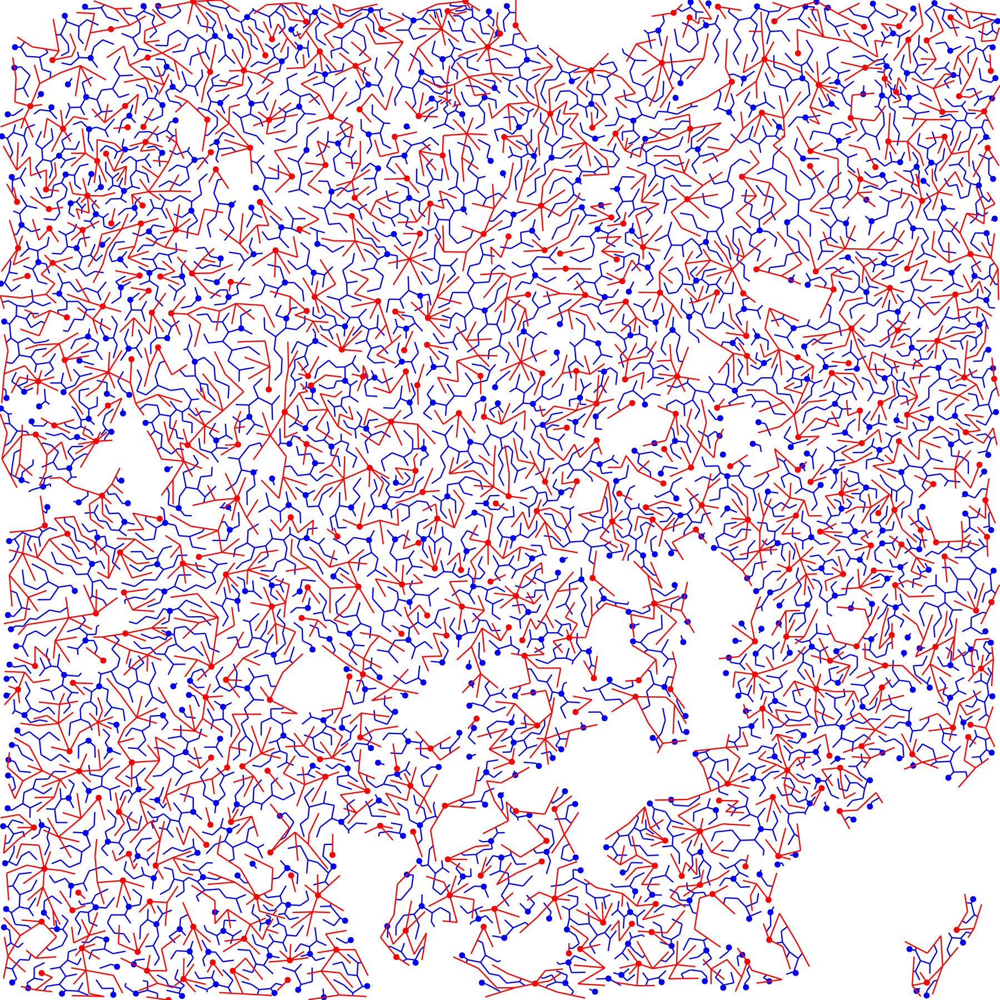

In [40]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() +     
        ## primary forest
        geom_point(data = dmt$tris[dmt$dual$maxima, ], aes(X, Y), color = 'blue', size = 2) + 
        geom_segment(data = dmt$dual$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'blue') + 

        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}


## extract epaths

In [41]:
dmt$e_sep = dmt_get_separatrices(dmt)

After DMT, we have a separatrix (in blue) and the primary forest connecting points (in red). 


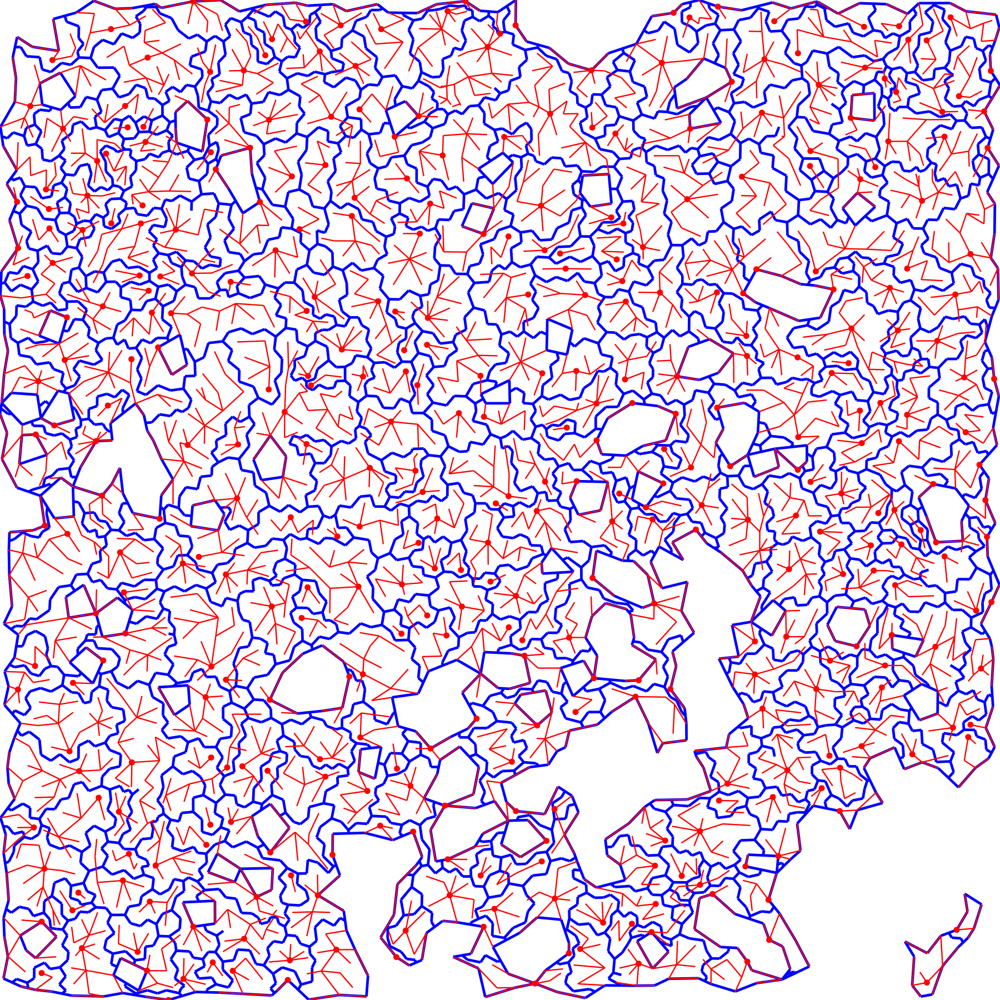

In [42]:
if (show_plots) {    
    fig.size(15, 15)
    ggplot() + 
    
        geom_segment(data = dmt$edges[dmt$e_sep, ], aes(x = x0_tri, y = y0_tri, xend = x1_tri, yend = y1_tri), lwd = 1, color = 'blue') + 
        geom_segment(data = dmt$edges[boundary == TRUE], aes(x = x0_pt, y = y0_pt, xend = x1_pt, yend = y1_pt), color = 'blue', lwd = 1) + 
    
        ## primary forest
        geom_point(data = dmt$pts[dmt$prim$minima, ], aes(X, Y), color = 'red', size = 2) + 
        geom_segment(data = dmt$prim$edges, aes(x=x0, y=y0, xend=x1, yend=y1), color = 'red') + 
    
        theme_void() + 
        coord_cartesian(expand = FALSE) + 
        NULL
}

## extract tiles



In [43]:
dmt = dmt_assign_tiles(dmt)
aggs = dmt_init_tiles(dmt)

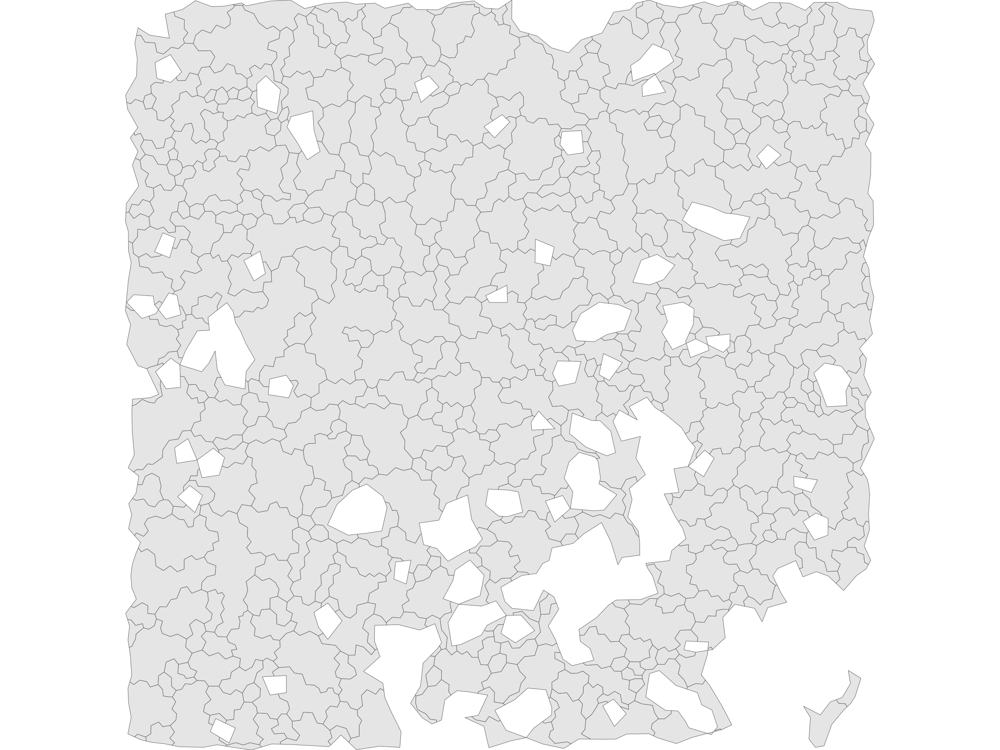

In [44]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        # geom_point(data = dmt$pts, aes(X, Y, color = factor(agg_id, sample(nrow(aggs$meta_data)))), size = 1) + 
        # scale_color_tableau() + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        # coord_cartesian(expand = FALSE) + 
        guides(color = 'none') + 
        
        NULL 
}

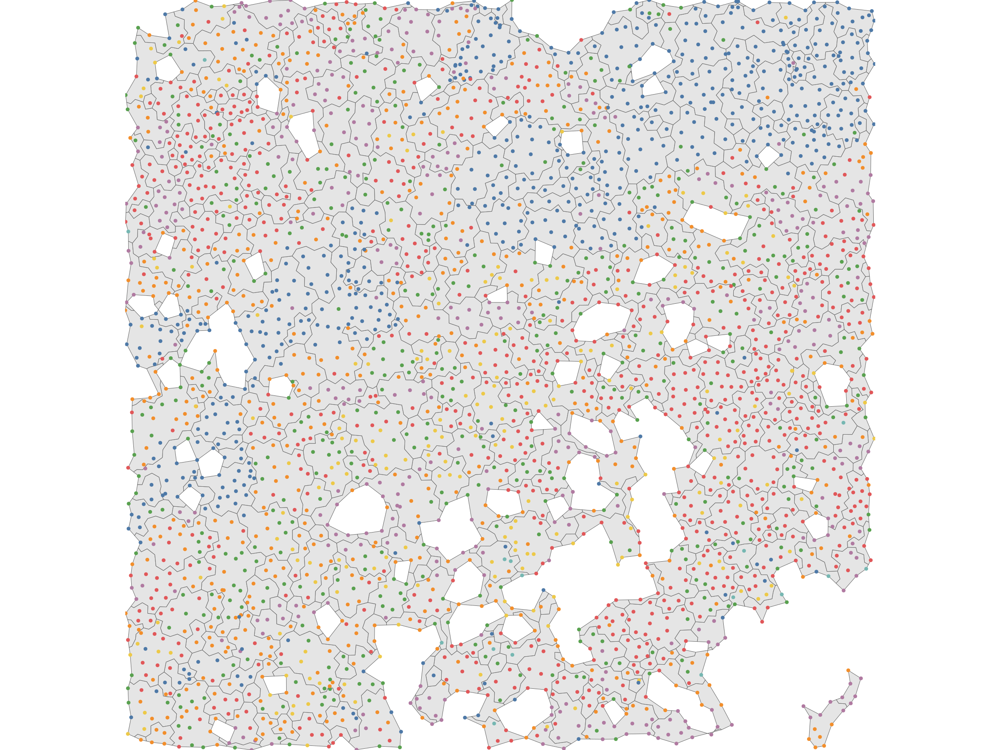

In [45]:
if (show_plots) {    
    set.seed(2)
    fig.size(15, 20)
    ggplot() + 
        geom_sf(data = aggs$meta_data$shape) + 
        geom_point(data = dmt$pts, aes(X, Y, color = type_lvl1)) + 
        theme_void() + 
        coord_sf(expand = FALSE) + 
        scale_color_tableau() + 
        guides(color = 'none') + 
        NULL 
}

# Step 3: Aggregation

## Merge main

First, merge similar aggregates that are nearby. 


In [46]:
aggs = init_scores(aggs, agg_mode=2, alpha=alpha, max_npts=max_npts)
aggs = merge_aggs(aggs, agg_mode=2, max_npts=max_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Merge small outliers

Then go ahead and merge small clusters that are smaller than 


In [47]:
aggs = init_scores(aggs, agg_mode=3, alpha=alpha, min_npts=min_npts)
aggs = merge_aggs(aggs, agg_mode=3, min_npts=min_npts)
dmt = update_dmt_aggid(dmt, aggs)
aggs = update_agg_shapes(dmt, aggs)

## Final tiles 

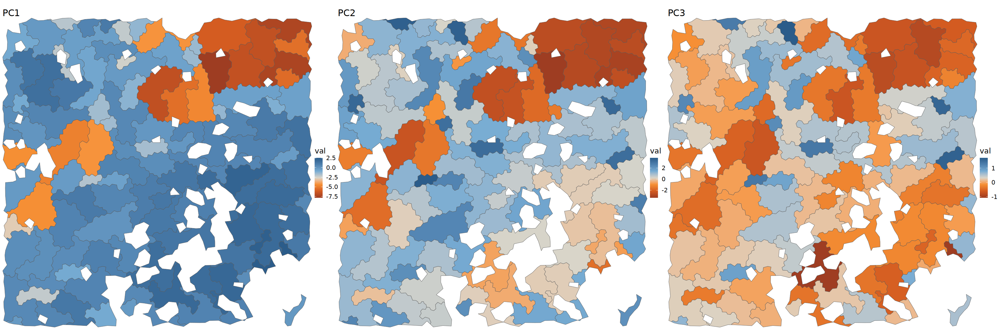

In [48]:
fig.size(10, 30)
if (show_plots) { 
    map(1:3, function(i) {
        ggplot(cbind(aggs$meta_data, val=aggs$pcs[, i])) + 
            geom_sf(aes(geometry = shape, fill = val)) + 
            theme_void(base_size = 16) + 
            coord_sf(expand = FALSE) + 
            scale_fill_gradient2_tableau() + 
            guides(color = 'none') + 
            labs(title = glue('PC{i}')) + 
            NULL 
    }) %>% 
        reduce(`|`)
}

# Results

In [49]:
head(aggs$meta_data)

id,X,Y,npts,shape,area,perimeter
<int>,<dbl>,<dbl>,<dbl>,<GEOMETRY>,<dbl>,<dbl>
1,5555.596,10051.04,19,POLYGON ((5592.255 10054.43...,1256.2489,204.2039
2,5560.983,10111.64,38,POLYGON ((5576.542 10151.47...,2907.6619,350.0635
3,5527.221,10039.83,49,POLYGON ((5568.195 10003.27...,3031.6303,380.4085
4,5609.770,10088.19,14,POLYGON ((5631.174 10097.96...,998.8177,189.5318
5,5529.298,10123.62,46,POLYGON ((5546.137 10154.05...,2847.6502,279.2407
6,5520.315,10162.25,15,POLYGON ((5546.137 10154.05...,842.1894,180.0852


In [50]:
head(dmt$pts)

X,Y,ORIG_ID,type_lvl1,type_lvl2,hubID,f,agg_id
<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<int>
5575.161,10049.24,1,Epithelial,Epithelial,H924,0.8406149,1
5548.940,10058.77,2,Epithelial,Epithelial,H856,1.0623045,1
5549.603,10101.12,3,Lymphocyte,CD4 T,H856,1.1638217,2
5570.112,10099.79,4,Myeloid,MERTK+ Macrophage,H856,1.0627859,2
5552.255,10001.83,5,Myeloid,FOLR2+CD14+ Macrophage,H924,1.8870315,3
5553.034,10034.65,6,Myeloid,MERTK+ Macrophage,H924,1.4457334,3
